### Question – 2:

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as dsets
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data import DataLoader, RandomSampler
import os
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset
import matplotlib.pyplot as plt
import numpy as np


In [13]:
class CelebADataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.image_folder = os.path.join(root, 'img_align_celeba')
        self.image_filenames = sorted(os.listdir(self.image_folder))

        # Load attributes
        attr_path = os.path.join(root, 'list_attr_celeba.txt')
        self.attributes = pd.read_csv(attr_path, delim_whitespace=True, skiprows=1, index_col=0)
        self.attributes.replace(-1, 0, inplace=True)


    def __getitem__(self, index):
        # Load image
        image_path = os.path.join(self.image_folder, self.image_filenames[index])
        image = Image.open(image_path).convert('RGB')

        # Apply transformation
        if self.transform:
            image = self.transform(image)

        # attributes = self.attributes.loc[self.image_filenames[index]].values.astype('float32')

        # att = torch.from_numpy(attributes)

        return image

    def __len__(self):
        return len(self.image_filenames)


In [14]:
batch_size = 128 
image_size = 64  # The target image size
path_to_data_root = './celebA'

# Transformations
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

celeba_dataset = CelebADataset(root=path_to_data_root, transform=transform)
train_loader = DataLoader(dataset=celeba_dataset, batch_size=batch_size, shuffle=True)

In [15]:
class Generator(nn.Module):
    def __init__(self, z_dim, img_channels, feature_maps):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(z_dim, feature_maps * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(feature_maps * 16),
            nn.ReLU(True),
            # state size. (feature_maps*16) x 4 x 4
            nn.ConvTranspose2d(feature_maps * 16, feature_maps * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 8),
            nn.ReLU(True),
            # state size. (feature_maps*8) x 8 x 8
            nn.ConvTranspose2d(feature_maps * 8, feature_maps * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 4),
            nn.ReLU(True),
            # state size. (feature_maps*4) x 16 x 16
            nn.ConvTranspose2d(feature_maps * 4, feature_maps * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 2),
            nn.ReLU(True),
            # state size. (feature_maps*2) x 32 x 32
            nn.ConvTranspose2d(feature_maps * 2, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (img_channels) x 64 x 64
        )

    def forward(self, input):
        return self.gen(input)


In [16]:
class Discriminator(nn.Module):
    def __init__(self, img_channels, feature_maps):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            # input is (img_channels) x 64 x 64
            nn.Conv2d(img_channels, feature_maps, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (feature_maps) x 32 x 32
            nn.Conv2d(feature_maps, feature_maps * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (feature_maps*2) x 16 x 16
            nn.Conv2d(feature_maps * 2, feature_maps * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (feature_maps*4) x 8 x 8
            nn.Conv2d(feature_maps * 4, feature_maps * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (feature_maps*8) x 4 x 4
            nn.Conv2d(feature_maps * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.disc(input).view(-1, 1).squeeze(1)

In [17]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [18]:
# Hyperparameters
z_dim = 100  # Latent vector size
img_channels = 3  # CelebA is RGB
feature_maps_gen = 128  # Feature map size for the generator
feature_maps_disc = 64  # Feature map size for the discriminator
lr = 0.0002  # Learning rate
beta1 = 0.5  # Beta1 hyperparam for Adam optimizers
num_epochs = 100  # Number of epochs to train for

generator = Generator(z_dim=z_dim, img_channels=img_channels, feature_maps=feature_maps_gen).to(device)
discriminator = Discriminator(img_channels=img_channels, feature_maps=feature_maps_disc).to(device)

# Handle multi-gpu if available
if (device.type == 'cuda') and (torch.cuda.device_count() > 1):
    generator = nn.DataParallel(generator)
    discriminator = nn.DataParallel(discriminator)

generator.apply(weights_init)
discriminator.apply(weights_init)

optimizerD = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(generator.parameters(), lr=lr, betas=(beta1, 0.999))

criterion = nn.BCELoss()

# fake vs real labels
real_label = 1
fake_label = 0

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0  # the iteration counter
num_batches_sampled_per_epoch = 150  # Number of batches to sample per epoch for training

In [32]:
print("Starting Training Loop...")
for epoch in range(num_epochs):
    # Sample a subset of batches for this epoch
    subset_sampler = torch.utils.data.RandomSampler(train_loader.dataset, replacement=True, num_samples=num_batches_sampled_per_epoch * batch_size)
    subset_data_loader = torch.utils.data.DataLoader(train_loader.dataset, batch_size=batch_size, sampler=subset_sampler)
    
    for i, data in enumerate(subset_data_loader, 0):
        ############################
        # (1) Update D network
        ###########################
        # Train with all-real batch
        discriminator.zero_grad()
        real_images = data.to(device)
        b_size = real_images.size(0)
        
        # Label smoothing
        real_labels_smooth = torch.full((b_size,), 0.9, dtype=torch.float, device=device)
        fake_labels_smooth = torch.full((b_size,), 0.1, dtype=torch.float, device=device)
        
        output = discriminator(real_images).view(-1)
        errD_real = criterion(output, real_labels_smooth)
        errD_real.backward()
        D_x = output.mean().item()

        # Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, z_dim, 1, 1, device=device)
        # Generate fake image batch with G
        fake_images = generator(noise)
        
        
        output = discriminator(fake_images.detach()).view(-1)
        errD_fake = criterion(output, fake_labels_smooth)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        optimizerD.step()

        ############################
        # (2) Update G network
        ###########################
        generator.zero_grad()
        # Real labels here since generator tries to fool the discriminator
        real_labels = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = discriminator(fake_images).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, real_labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()


        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(subset_data_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        
    # Save models at checkpoints
    if (epoch + 1) % 5 == 0:
        torch.save(generator.state_dict(), os.path.join(f'generator_epoch_{epoch+1}.pkl'))
        torch.save(discriminator.state_dict(), os.path.join(f'discriminator_epoch_{epoch+1}.pkl'))
        print(f'Models saved for epoch {epoch+1}')

        iters += 1


Starting Training Loop...
[0/100][0/150]	Loss_D: 1.6932	Loss_G: 2.9641	D(x): 0.3938	D(G(z)): 0.4020 / 0.0674
[0/100][50/150]	Loss_D: 1.5832	Loss_G: 12.3951	D(x): 0.6563	D(G(z)): 0.0006 / 0.0000
[0/100][100/150]	Loss_D: 2.1504	Loss_G: 6.6988	D(x): 0.7073	D(G(z)): 0.7170 / 0.0018
[1/100][0/150]	Loss_D: 1.6765	Loss_G: 0.6239	D(x): 0.3574	D(G(z)): 0.3657 / 0.5798
[1/100][50/150]	Loss_D: 1.5001	Loss_G: 1.5714	D(x): 0.5317	D(G(z)): 0.4623 / 0.2434
[1/100][100/150]	Loss_D: 1.6064	Loss_G: 0.9561	D(x): 0.4743	D(G(z)): 0.5102 / 0.4075
[2/100][0/150]	Loss_D: 1.4692	Loss_G: 0.8205	D(x): 0.4814	D(G(z)): 0.4755 / 0.4513
[2/100][50/150]	Loss_D: 1.4563	Loss_G: 0.9948	D(x): 0.5209	D(G(z)): 0.5039 / 0.3856
[2/100][100/150]	Loss_D: 1.3340	Loss_G: 1.1363	D(x): 0.5784	D(G(z)): 0.4915 / 0.3392
[3/100][0/150]	Loss_D: 1.4588	Loss_G: 0.8908	D(x): 0.4622	D(G(z)): 0.4519 / 0.4307
[3/100][50/150]	Loss_D: 1.3112	Loss_G: 0.9537	D(x): 0.5178	D(G(z)): 0.4321 / 0.4021
[3/100][100/150]	Loss_D: 1.4875	Loss_G: 1.1506	D(x

: 

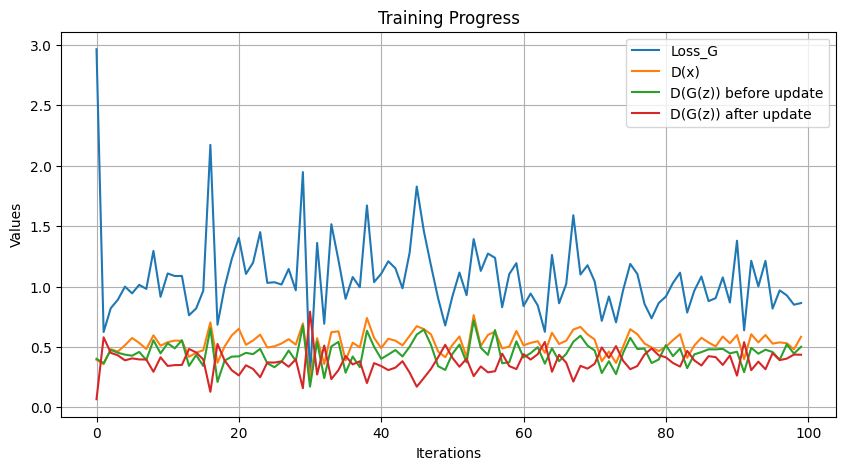

In [7]:
# manually pulled from the training logs
loss_g_list =  [2.9641, 0.6239, 0.8205, 0.8908, 0.9993, 0.9435, 1.0142, 0.9805, 1.295, 0.9153, 1.1083, 1.0869, 1.0878, 0.7624, 0.8186, 0.965, 2.1724, 0.684, 0.9948, 1.2265, 1.4032, 1.1042, 1.1979, 1.4505, 1.0304, 1.0355, 1.0166, 1.1451, 0.9691, 1.9471, 0.2382, 1.3606, 0.6921, 1.5156, 1.218, 0.8984, 1.0784, 0.9941, 1.6708, 1.0367, 1.1055, 1.2091, 1.151, 0.9853, 1.2805, 1.8274, 1.4586, 1.1734, 0.903, 0.6779, 0.9162, 1.1158, 0.9284, 1.3927, 1.1296, 1.2727, 1.2377, 0.8287, 1.103, 1.1935, 0.8387, 0.942, 0.8435, 0.6253, 1.2615, 0.8616, 1.0201, 1.5901, 1.0993, 1.1762, 1.0421, 0.7162, 0.9178, 0.7036, 0.9713, 1.1873, 1.1039, 0.8567, 0.7372, 0.8635, 0.9167, 1.0296, 1.1146, 0.7846, 0.9653, 1.083, 0.8792, 0.9039, 1.0758, 0.8677, 1.3792, 0.6374, 1.2135, 1.0011, 1.2124, 0.8176, 0.9681, 0.9268, 0.8497, 0.8633]
dx_list = [0.3938, 0.3574, 0.4814, 0.4622, 0.5142, 0.5742, 0.5334, 0.4828, 0.5963, 0.5106, 0.5393, 0.5529, 0.5506, 0.418, 0.4523, 0.4728, 0.7036, 0.3688, 0.5038, 0.5951, 0.6504, 0.5176, 0.5536, 0.6018, 0.4955, 0.5051, 0.5289, 0.5645, 0.5193, 0.695, 0.243, 0.573, 0.3588, 0.6221, 0.6292, 0.3886, 0.5353, 0.4965, 0.7399, 0.5759, 0.4908, 0.568, 0.5521, 0.5132, 0.5918, 0.672, 0.6478, 0.6046, 0.4625, 0.4145, 0.5161, 0.5871, 0.4162, 0.7634, 0.5075, 0.5995, 0.6269, 0.4884, 0.5025, 0.6323, 0.5137, 0.5333, 0.5478, 0.4514, 0.6177, 0.5246, 0.5512, 0.6439, 0.6658, 0.604, 0.5613, 0.3819, 0.4619, 0.3676, 0.5027, 0.6471, 0.6049, 0.5284, 0.4959, 0.4658, 0.5009, 0.5565, 0.6063, 0.41, 0.5121, 0.5758, 0.5369, 0.5044, 0.5865, 0.5307, 0.5979, 0.3993, 0.6054, 0.5378, 0.5991, 0.5277, 0.5378, 0.5306, 0.4805, 0.5841]
d_gz_1_list = [0.402, 0.3657, 0.4755, 0.4519, 0.4365, 0.4275, 0.4589, 0.3922, 0.5557, 0.4471, 0.5306, 0.4887, 0.5554, 0.343, 0.4329, 0.3429, 0.6531, 0.2107, 0.3869, 0.4198, 0.4225, 0.4513, 0.4406, 0.4842, 0.3648, 0.3323, 0.3783, 0.4705, 0.3852, 0.6766, 0.1717, 0.5434, 0.242, 0.5049, 0.5416, 0.2871, 0.421, 0.3322, 0.6339, 0.5021, 0.402, 0.4369, 0.4744, 0.4213, 0.5017, 0.6025, 0.6437, 0.517, 0.341, 0.3098, 0.4422, 0.5199, 0.3727, 0.7202, 0.4934, 0.4344, 0.6399, 0.365, 0.3732, 0.5468, 0.4134, 0.4486, 0.4984, 0.3619, 0.4888, 0.3823, 0.4424, 0.5428, 0.5926, 0.5107, 0.4705, 0.2839, 0.382, 0.2749, 0.4506, 0.576, 0.4832, 0.4861, 0.367, 0.3959, 0.5151, 0.4238, 0.4872, 0.3244, 0.4387, 0.4573, 0.4804, 0.4798, 0.4845, 0.4467, 0.4603, 0.2912, 0.4928, 0.4441, 0.4772, 0.4581, 0.3944, 0.5218, 0.4448, 0.5015]
d_gz_2_list = [0.0674, 0.5798, 0.4513, 0.4307, 0.3891, 0.4054, 0.3968, 0.3958, 0.2945, 0.4143, 0.3429, 0.3497, 0.351, 0.4834, 0.4545, 0.3966, 0.1287, 0.5249, 0.3889, 0.3075, 0.2644, 0.3484, 0.3177, 0.2493, 0.3717, 0.371, 0.3808, 0.3362, 0.3973, 0.1589, 0.7922, 0.2715, 0.5118, 0.2336, 0.3084, 0.4252, 0.3555, 0.3816, 0.2014, 0.3661, 0.3421, 0.3084, 0.3287, 0.3819, 0.2877, 0.171, 0.2434, 0.3186, 0.4143, 0.5182, 0.4113, 0.3365, 0.4027, 0.2586, 0.3388, 0.2899, 0.299, 0.4445, 0.3417, 0.3168, 0.4403, 0.3955, 0.4397, 0.5414, 0.2948, 0.4349, 0.3698, 0.2133, 0.3435, 0.3206, 0.3605, 0.4962, 0.4095, 0.5071, 0.3853, 0.3159, 0.3422, 0.4376, 0.4875, 0.4311, 0.4144, 0.3672, 0.3375, 0.4679, 0.3887, 0.3466, 0.4235, 0.416, 0.3513, 0.4294, 0.2624, 0.5398, 0.308, 0.3784, 0.3154, 0.4487, 0.3909, 0.4036, 0.437, 0.4354]

length = min(len(loss_g_list), len(dx_list), len(d_gz_1_list), len(d_gz_2_list))
loss_g_list = loss_g_list[:length]
dx_list = dx_list[:length]
d_gz_1_list = d_gz_1_list[:length]
d_gz_2_list = d_gz_2_list[:length]

plt.figure(figsize=(10, 5))
plt.plot(loss_g_list, label='Loss_G')
plt.plot(dx_list, label='D(x)')
plt.plot(d_gz_1_list, label='D(G(z)) before update')
plt.plot(d_gz_2_list, label='D(G(z)) after update')

plt.xlabel('Iterations')
plt.ylabel('Values')
plt.title('Training Progress')
plt.legend()

plt.grid(True)
plt.show()

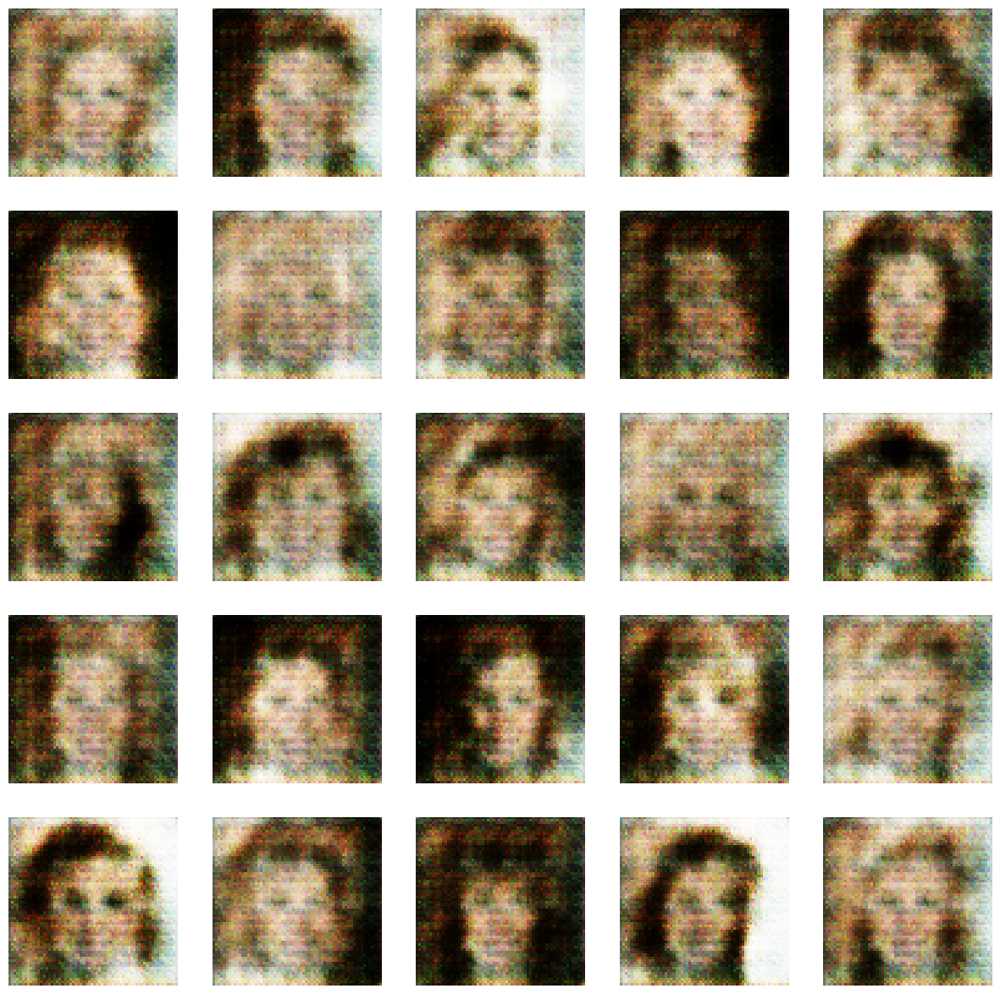

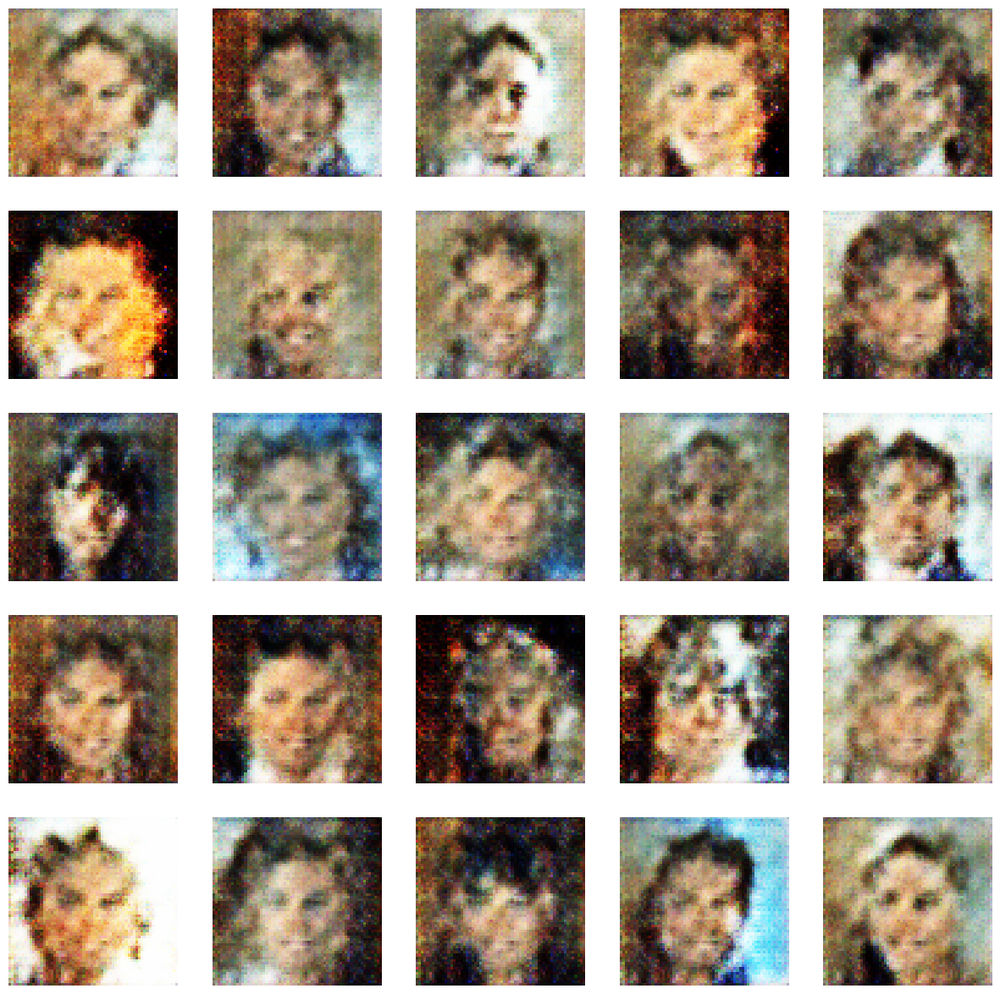

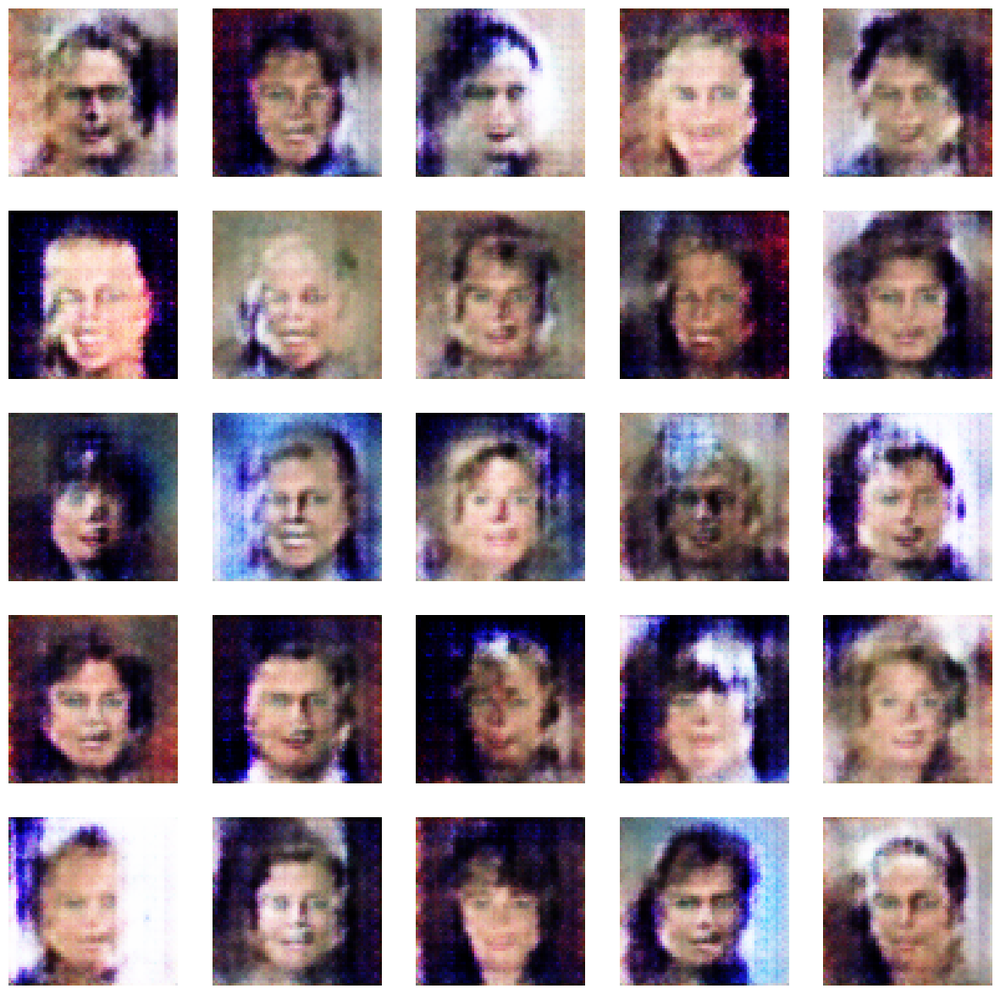

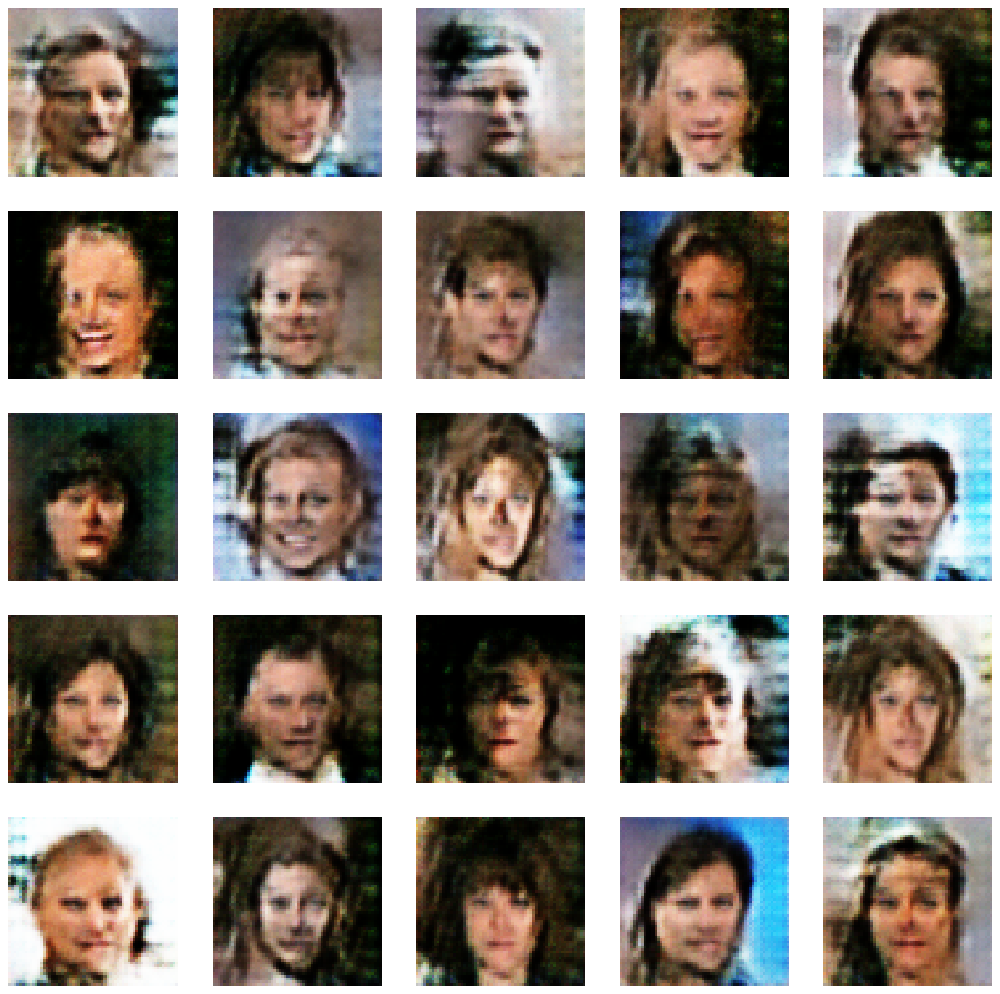

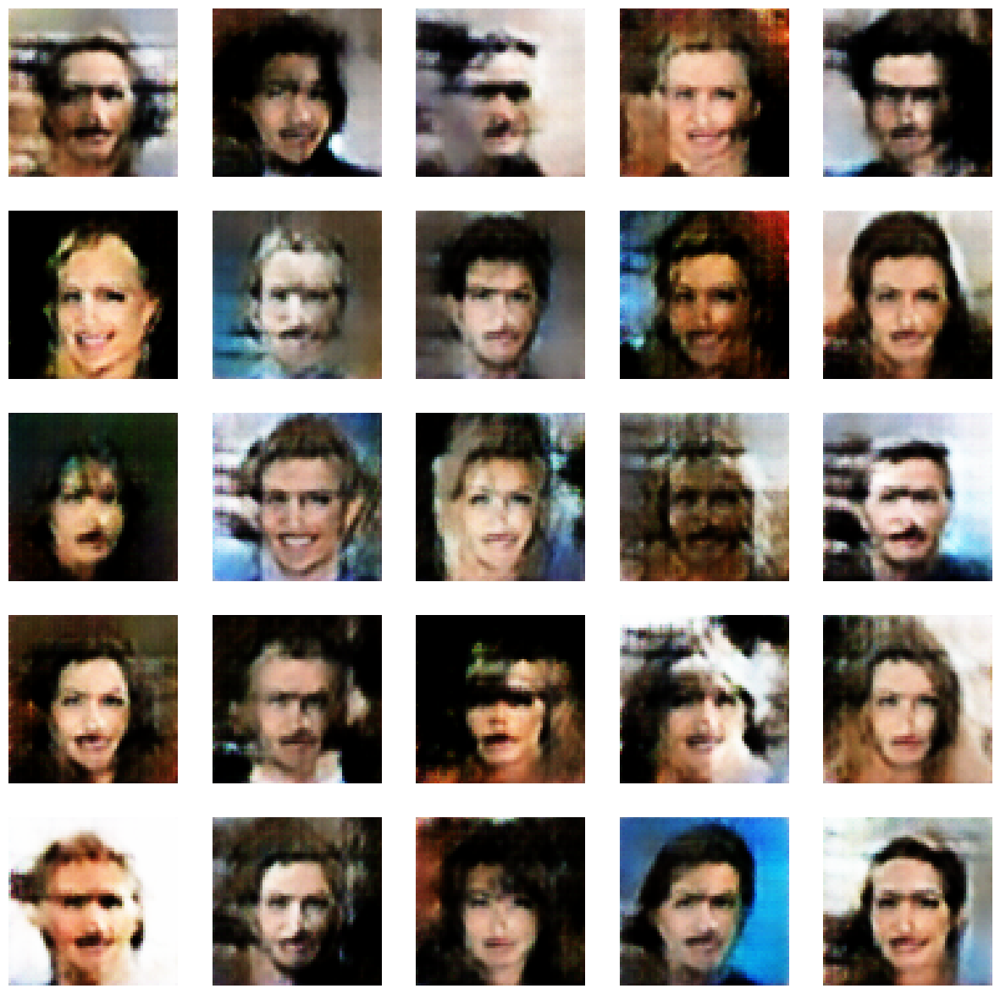

...

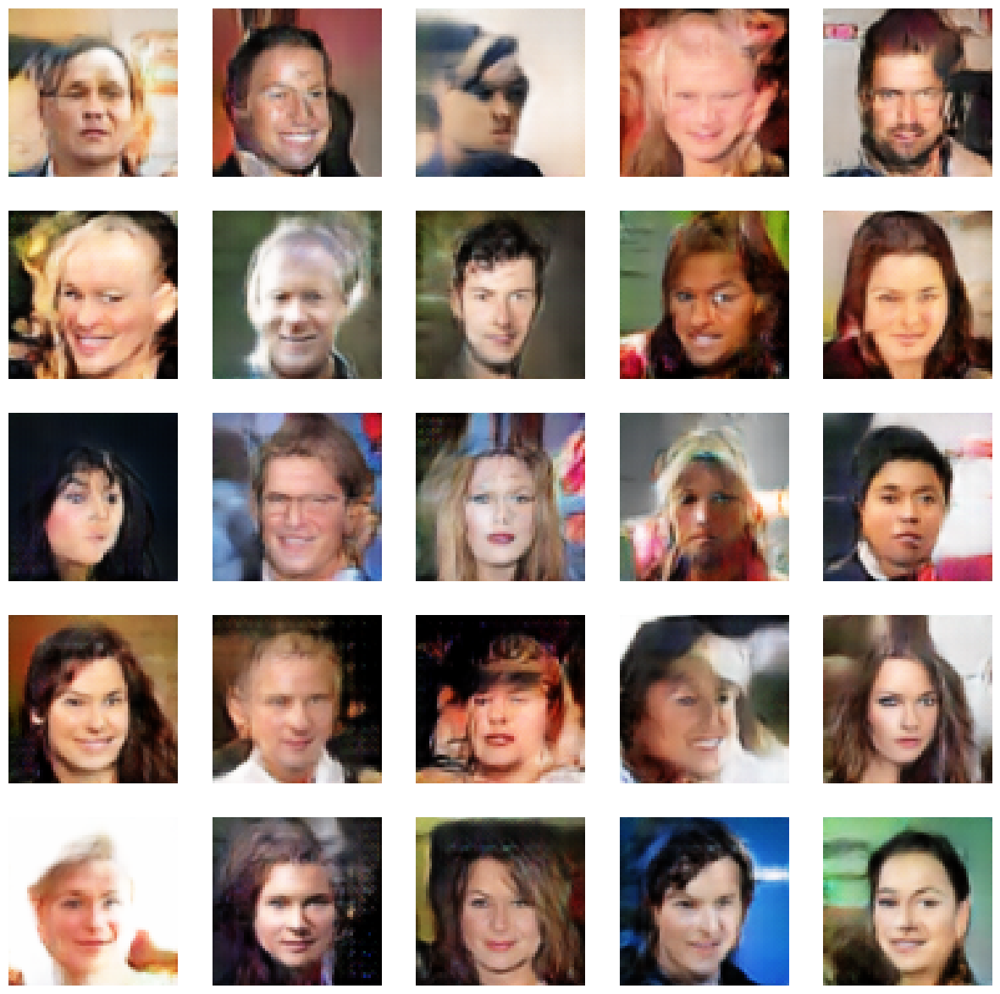

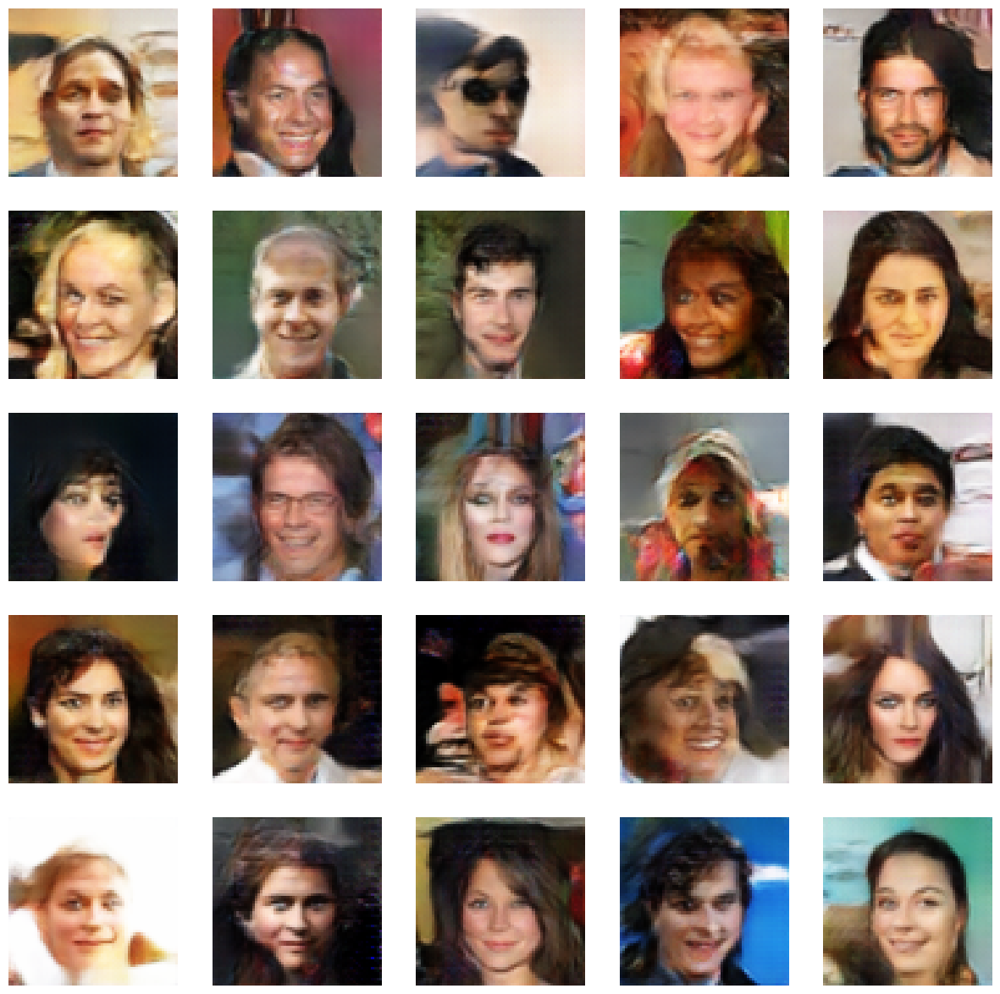

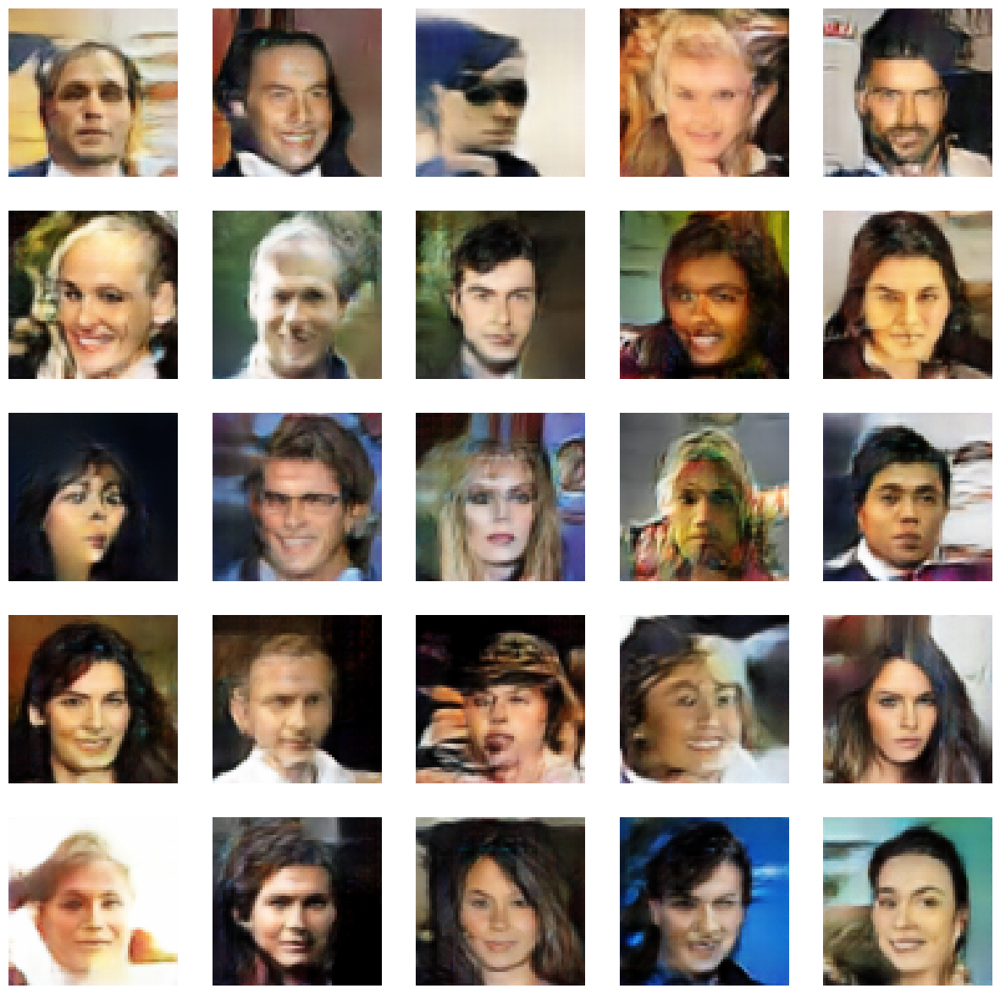

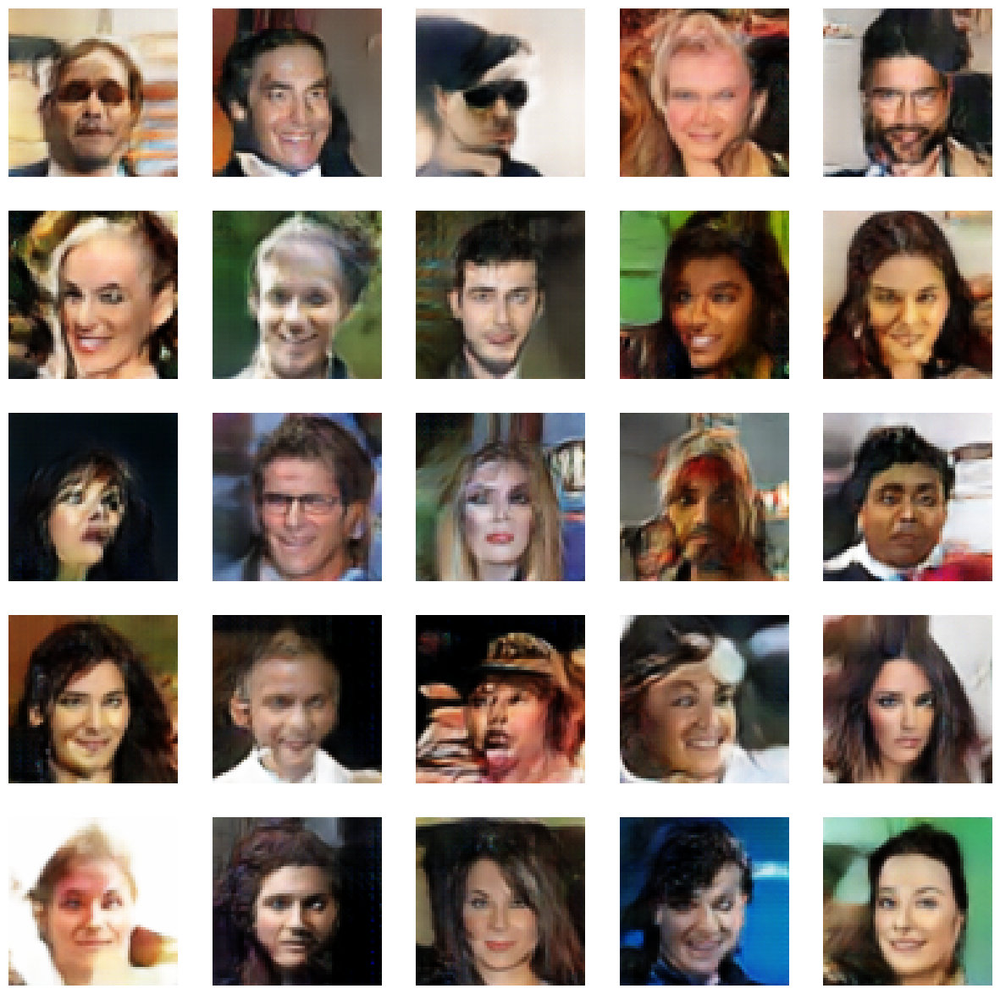

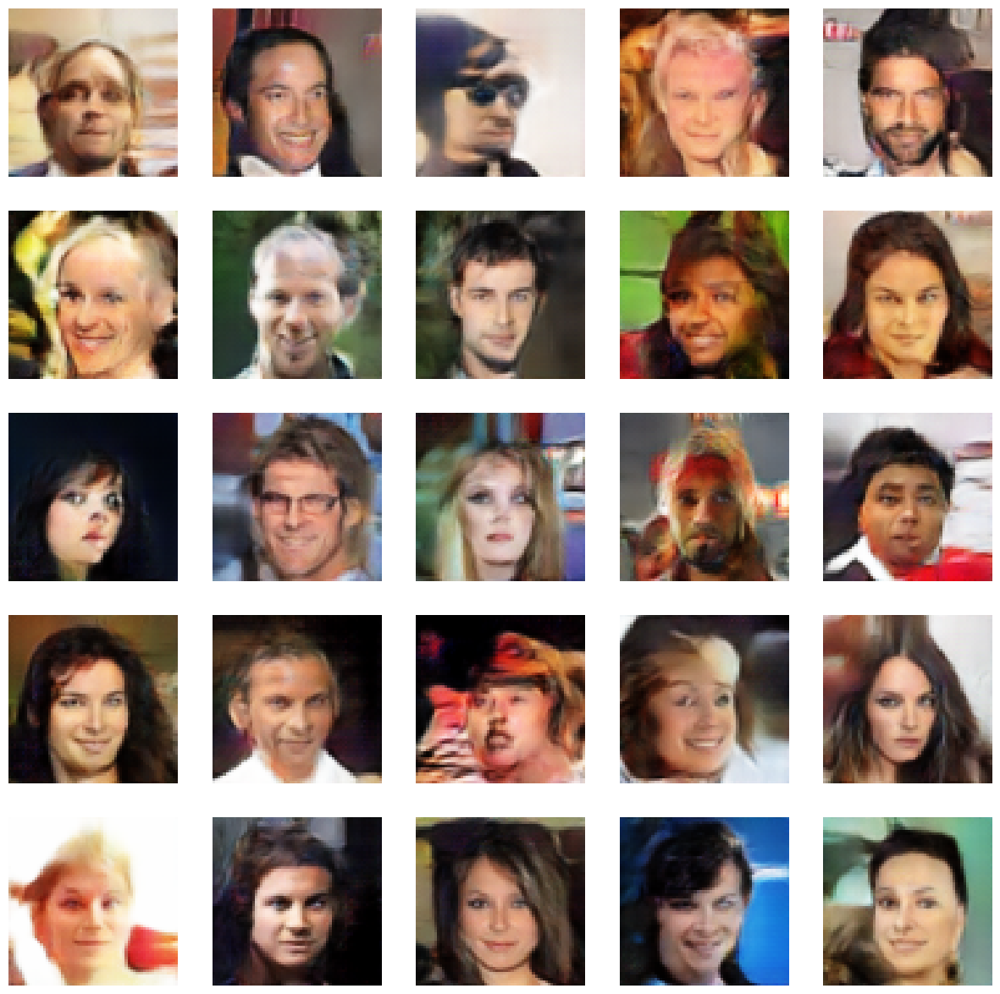

In [8]:
# Function to denormalize the image
def denormalize(image):
    image = image * 0.5 + 0.5
    image = image.clamp(0, 1)
    image = image.numpy()
    return np.transpose(image, (1, 2, 0))

generator.eval()

# Generate batch of latent vectors
noise = torch.randn(batch_size, z_dim, 1, 1, device=device)

for i in range(5, 101, 5):
    generator.load_state_dict(torch.load(f'./generator_epoch_{i}.pkl', map_location=device))

    # Generate a batch of images with G
    with torch.no_grad():
        generated_images = generator(noise).detach().cpu()

    # Visualize the generated images
    plt.figure(figsize=(15, 15))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.imshow(denormalize(generated_images[i]))
        plt.axis('off')
    plt.show()


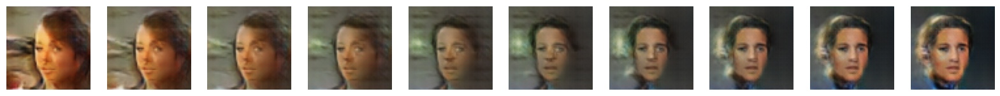

In [27]:
generator.eval()  # Ensure the generator is in evaluation mode

# Generate two random latent vectors
z_dim = 100
z_start = torch.randn(1, z_dim, 1, 1)
z_end = torch.randn(1, z_dim, 1, 1)

def denormalize(image):
    image = image * 0.5 + 0.5
    image = image.clamp(0, 1) 
    image = image.detach().cpu().numpy()
    return np.transpose(image, (1, 2, 0))

# Interpolation function
def interpolate(start, end, steps=10):
    interpolation = []
    for alpha in np.linspace(0, 1, steps):
        vec = start * (1 - alpha) + end * alpha
        interpolation.append(vec)
    return interpolation

# Generate interpolated images
steps = 10
interpolated_vectors = interpolate(z_start, z_end, steps)
images = [generator(z).squeeze(0) for z in interpolated_vectors]  # Squeeze to remove batch dimension

fig, axs = plt.subplots(1, steps, figsize=(20, 2))
for i, img in enumerate(images):
    image = denormalize(img)
    axs[i].imshow(image)
    axs[i].axis('off')
plt.show()


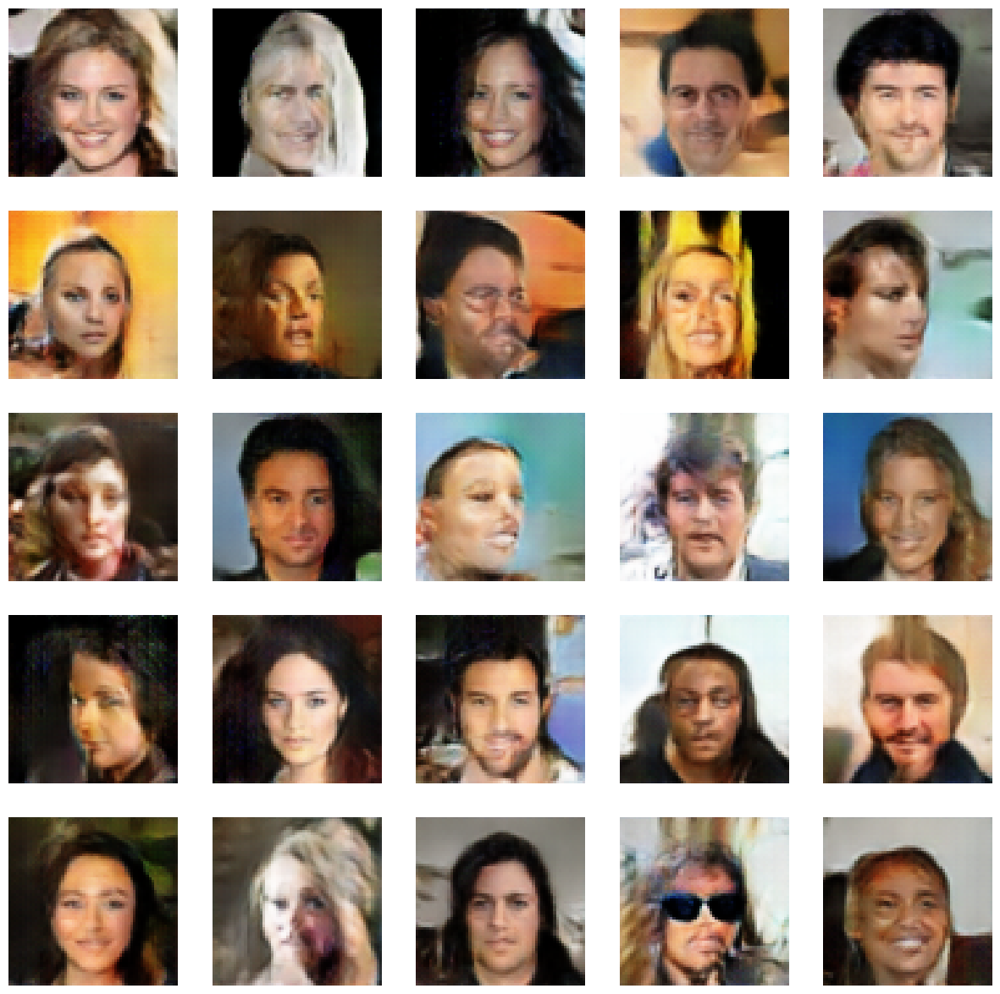

In [10]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np

#set seed
torch.manual_seed(42)

class Generator(nn.Module):
    def __init__(self, z_dim, img_channels, feature_maps):
        super(Generator, self).__init__()
        self.gen = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(z_dim, feature_maps * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(feature_maps * 16),
            nn.ReLU(True),
            # state size. (feature_maps*16) x 4 x 4
            nn.ConvTranspose2d(feature_maps * 16, feature_maps * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 8),
            nn.ReLU(True),
            # state size. (feature_maps*8) x 8 x 8
            nn.ConvTranspose2d(feature_maps * 8, feature_maps * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 4),
            nn.ReLU(True),
            # state size. (feature_maps*4) x 16 x 16
            nn.ConvTranspose2d(feature_maps * 4, feature_maps * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(feature_maps * 2),
            nn.ReLU(True),
            # state size. (feature_maps*2) x 32 x 32
            nn.ConvTranspose2d(feature_maps * 2, img_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (img_channels) x 64 x 64
        )

    def forward(self, input):
        return self.gen(input)
    
# Function to denormalize the image
def denormalize(image):
    image = image * 0.5 + 0.5
    image = image.clamp(0, 1)
    image = image.numpy()
    return np.transpose(image, (1, 2, 0))
    
# Hyperparameters
z_dim = 100  # Latent vector size
img_channels = 3  # CelebA is RGB
feature_maps_gen = 128  # Feature map size for the generator
feature_maps_disc = 64  # Feature map size for the discriminator
lr = 0.0002  # Learning rate
beta1 = 0.5  # Beta1 hyperparam for Adam optimizers
num_epochs = 100  # Number of epochs to train for
batch_size = 128

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
noise = torch.randn(batch_size, z_dim, 1, 1, device=device)

def reproduce_hw3():
    generator = Generator(z_dim=z_dim, img_channels=img_channels, feature_maps=feature_maps_gen).to(device)
    generator.load_state_dict(torch.load('./generator_epoch_65.pkl', map_location=device))

    # Generate a batch of images with G
    with torch.no_grad():
        generated_images = generator(noise).detach().cpu()

    # Visualize the generated images
    plt.figure(figsize=(15, 15))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.imshow(denormalize(generated_images[i]))
        plt.axis('off')
    plt.show()

reproduce_hw3()
